### CITS4404 Practical Project

# Camo Worms!

<div style="margin-left: 0px">
    &nbsp;
    <img src="velvet-worms.jpg" width=600>
    <br>
    <br>
</div>

Australian _velvet worms_ come in many colours, possibly as a camouflage function ([Current Biology](https://www.cell.com/current-biology/comments/S0960-9822(11)00208-9)).



In [13]:
# Imports

import numpy as np
import imageio.v3 as iio

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.patches as mpatches
import matplotlib.bezier as mbezier
from sklearn.metrics.pairwise import euclidean_distances
import copy

rng = np.random.default_rng()
Path = mpath.Path
#mpl.rcParams['figure.dpi']= 72 #size of images


In [14]:
# Global variables

IMAGE_DIR = 'images'
IMAGE_NAME='original'
MASK = [320, 560, 160, 880] # ymin ymax xmin xmax

Image name (shape) (intensity max, min, mean, std)

original (240, 720) (210, 0, 49.3, 34.8)


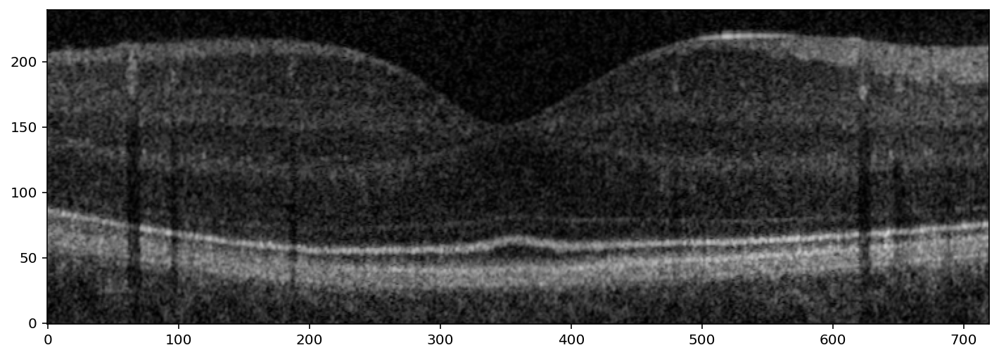

In [15]:
# Read, crop and display image and stats

def crop (image, mask):
    h, w = np.shape(image)
    return image[max(mask[0],0):min(mask[1],h), max(mask[2],0):min(mask[3],w)]

def prep_image (imdir, imname, mask):
    print("Image name (shape) (intensity max, min, mean, std)\n")
    image = np.flipud(crop(iio.imread(imdir+'/'+imname+".png"), mask))
    print("{} {} ({}, {}, {}, {})".format(imname, np.shape(image), np.max(image), np.min(image), round(np.mean(image),1), round(np.std(image),1)))
    plt.imshow(image, vmin=0, vmax=255, cmap='gray', origin='lower') # use vmin and vmax to stop imshow from scaling
    plt.show()
    return image

image = prep_image(IMAGE_DIR, IMAGE_NAME, MASK)
original_image = image

In [16]:
np.unique(image)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [17]:
class Camo_Worm:
    def __init__(self, x, y, r, theta, deviation_r, deviation_gamma, width, colour):
        self.x = x
        self.y = y
        self.r = r
        self.theta = theta
        self.dr = deviation_r
        self.dgamma = deviation_gamma
        self.width = width
        self.colour = colour
        p0 = [self.x - self.r * np.cos(self.theta), self.y - self.r * np.sin(self.theta)]
        p2 = [self.x + self.r * np.cos(self.theta), self.y + self.r * np.sin(self.theta)]
        p1 = [self.x + self.dr * np.cos(self.theta+self.dgamma), self.y + self.dr * np.sin(self.theta+self.dgamma)]
        self.bezier = mbezier.BezierSegment(np.array([p0, p1,p2]))

    def control_points (self):
        return self.bezier.control_points

    def path (self):
        return mpath.Path(self.control_points(), [Path.MOVETO, Path.CURVE3, Path.CURVE3])

    def patch (self):
        return mpatches.PathPatch(self.path(), fc='None', ec=str(self.colour), lw=self.width, capstyle='round')

    def intermediate_points (self, intervals=None):
        if intervals is None:
            intervals = max(3, int(np.ceil(self.r/8)))
        return self.bezier.point_at_t(np.linspace(0,1,intervals))

    def approx_length (self):
        intermediates = self.intermediate_points()
        eds = euclidean_distances(intermediates,intermediates)
        return np.sum(np.diag(eds,1))

    def colour_at_t(self, t, image):
        intermediates = np.int64(np.round(np.array(self.bezier.point_at_t(t)).reshape(-1,2)))
        colours = [image[point[0],point[1]] for point in intermediates]
        return(np.array(colours)/255)


In [18]:
class Drawing:
    def __init__ (self, image):
        self.fig, self.ax = plt.subplots()
        self.image = image
        self.im = self.ax.imshow(self.image, cmap='gray', origin='lower')

    def add_patches(self, patches):
        try:
            for patch in patches:
                self.ax.add_patch(patch)
        except TypeError:
            self.ax.add_patch(patches)

    def add_dots(self, points, radius=4, **kwargs):
        try:
            for point in points:
                self.ax.add_patch(mpatches.Circle((point[0],point[1]), radius, **kwargs))
        except TypeError:
            self.ax.add_patch(mpatches.Circle((points[0],points[1]), radius, **kwargs))

    def add_worms(self, worms):
        try:
            self.add_patches([w.patch() for w in worms])
        except TypeError:
            self.add_patches([worms.patch()])

    def show(self, save=None):
        if save is not None:
            plt.savefig(save)
        plt.show()


In [19]:
# Example of a random worm. You may do this differently.

    # centre points, angles and colour chosen from uniform distributions
    # lengths chosen from normal distributions with two std parameters passed
    # width chosen from gamma distribution with shape parameter 3 and scale passed

def random_worm (imshape, init_params):
    (radius_std, deviation_std, width_theta) = init_params
    (ylim, xlim) = imshape
    midx = xlim * rng.random()
    midy = ylim * rng.random()
    r = radius_std * np.abs(rng.standard_normal())
    theta = rng.random() * np.pi
    dr = deviation_std * np.abs(rng.standard_normal())
    dgamma = rng.random() * np.pi
    colour = rng.random()
    width = width_theta * rng.standard_gamma(3)
    return Camo_Worm(midx, midy, r, theta, dr, dgamma, width, colour)


In [20]:
# Initialise a random clew

def initialise_clew (size, imshape, init_params):
    clew = []
    for i in range(size):
        clew.append(random_worm(imshape, init_params))
    return clew

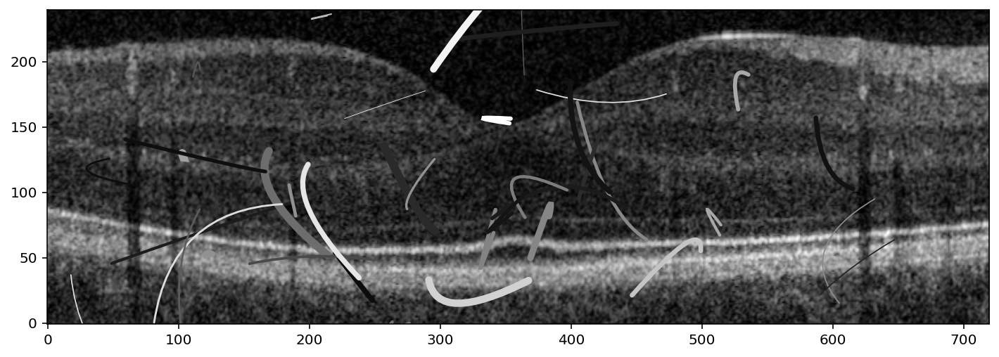

In [21]:
# Initialise clew of 40 and draw

clew = initialise_clew(40, image.shape, (40, 30, 1))
drawing = Drawing(image)
drawing.add_worms(clew)
drawing.show(save='test_im2.png')

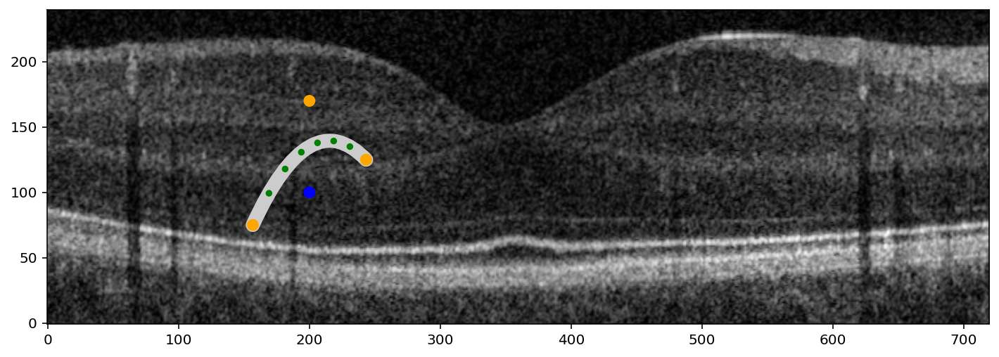

In [22]:
# Draw a single worm along with control points and some sample points

worm = Camo_Worm(200, 100, 50, np.pi/6, 70, np.pi/3, 10, 0.8)
drawing = Drawing(image)
drawing.add_worms(worm)
drawing.add_dots(worm.intermediate_points(8), radius=2, color='green')
drawing.add_dots(worm.control_points(),color='orange')
drawing.add_dots((200,100), color='blue')

drawing.show(save='bezier.png')

&copy; Cara MacNish, UWA, 2024



# ------------------------------------------------------------------------------

# Distance between worms

In [23]:
import matplotlib.colors as mcolors

In [24]:
# Initialise clew
clew = initialise_clew(3, image.shape, (40, 30, 1))

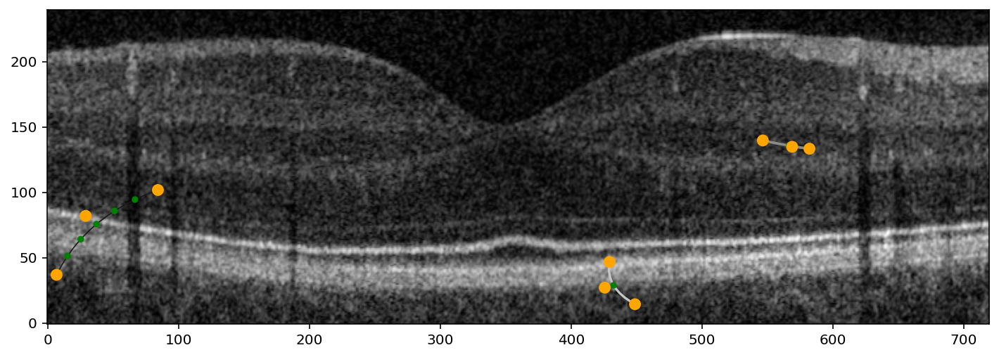

In [25]:
# Draw
drawing = Drawing(image)
drawing.add_worms(clew)
for worm in clew:
    drawing.add_dots(worm.intermediate_points(), radius=2, color='green')
    drawing.add_dots(worm.control_points(),color='orange')
drawing.show()

In [26]:
# Make list of intermediade points + extrema control points (not the middle point) for each worm
all_points = []
for i in range(len(clew)):
    all_points.append(list(np.vstack((clew[i].control_points()[0],clew[i].control_points()[2],clew[i].intermediate_points()))))

In [27]:
# matrix for shortest distances
D = np.zeros((len(clew),len(clew)))
# dict for points that have the shortest distance
shortest_distance = dict(zip(list(np.arange(len(clew))),[ [] for _ in range(len(clew)) ]))

# loop through all worms (but the last)
for m in range(len(clew)-1):
    # loop throug all remaining worms
    for n in range(m+1,len(clew)):
        dist = 100000
        # loop through all points in worm m
        for i in all_points[m]:
            # loop through all points in worm n
            for j in all_points[n]:
                dist_temp = np.linalg.norm(i-j) # calculate eucledian distance
                if dist_temp < dist:
                    dist = dist_temp # update distance variable if this distance is shorter

                    D[m][n] = dist # append shortest distance to matrix
                    p = (i,j) # save the two points
                
        shortest_distance[m].append(p) # append the points to dict

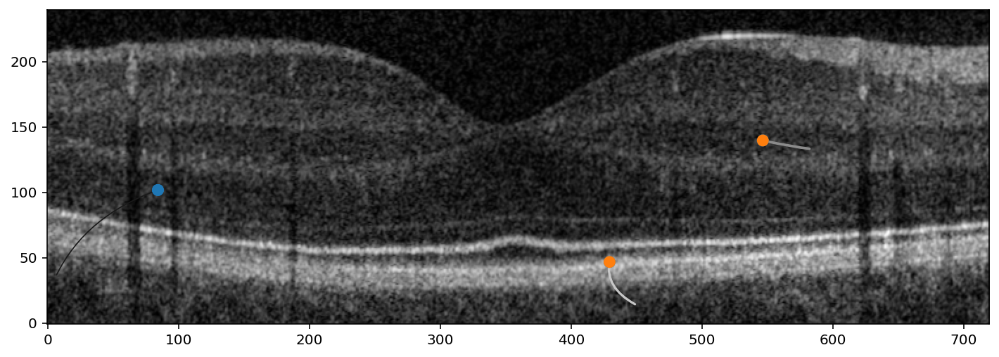

In [28]:
# draw the points
colors = list(mcolors.TABLEAU_COLORS.keys())
drawing = Drawing(image)
drawing.add_worms(clew)
for i in range(len(shortest_distance)):
    for j in range(len(shortest_distance[i])):
        drawing.add_dots((shortest_distance[i][j][0],shortest_distance[i][j][1]),color=colors[i])

drawing.show()

## Make circular mask and find image intensity

In [29]:
clew = initialise_clew(5, image.shape, (40, 30, 1))

In [30]:
### The following function is inspired by answers given on this page:
# https://stackoverflow.com/questions/44865023/how-can-i-create-a-circular-mask-for-a-numpy-array

def circular_mask(image,center,radius):
    # get image dimensions
    h = image.shape[1]
    w = image.shape[0]

    # create matrix with same shape as image and elements being the distance from the center point
    Y, X = np.ogrid[:w, :h]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
    
    # create mask. True in pixels that are closer than the radius to the center. False everywhere else
    mask = dist_from_center <= radius
    return mask

0
1
2
3
4


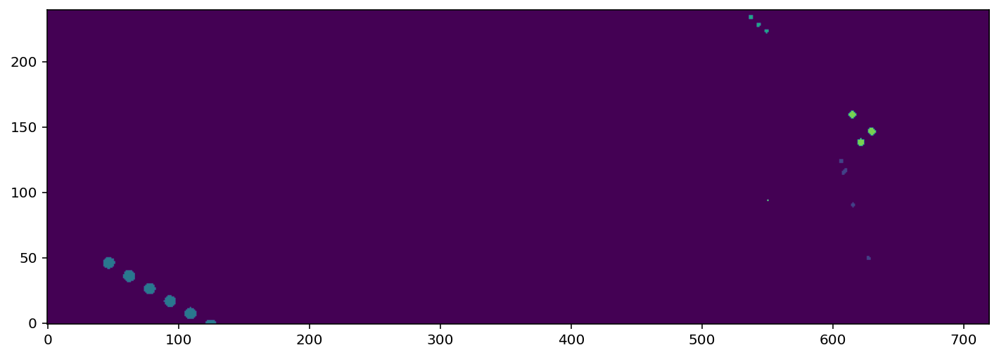

In [31]:
# create a masked image for clew
masked_img = np.zeros([image.shape[0],image.shape[1]]).astype(int)
# create a string to store mean intensity and standard variation for each worm
worm_intensities = []

for worm_index in range(len(clew)): # loop through worms in clew
    print(worm_index)
    worm = clew[worm_index]
    masked_img_worm = np.zeros([image.shape[0],image.shape[1]]).astype(int) # initialize mask with zeros
    for i in range(len(worm.intermediate_points())): # loop through intermediate points in worm
        mask = circular_mask(image,[worm.intermediate_points()[i][0],worm.intermediate_points()[i][1]],worm.width) # make circular mask
        masked_img[mask] = int(worm_index+1) # classify points based on the worm it belongs to
    masked_img_worm = masked_img # mask for each worm
    worm_intensities.append((np.mean(image * masked_img_worm), np.std((image * masked_img_worm)[(image * masked_img_worm)>0]))) # update values
        
clew_intensities = (np.mean(image * masked_img), np.std((image * masked_img)[(image * masked_img)>0]))

plt.imshow(masked_img)
plt.gca().invert_yaxis()

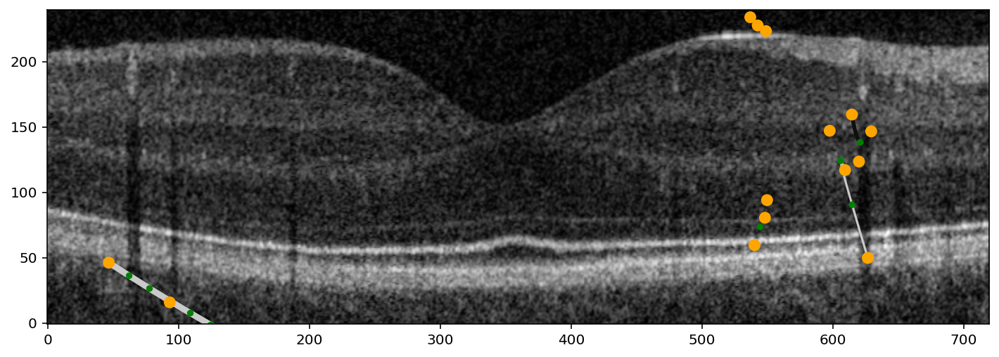

In [32]:
# Draw
drawing = Drawing(image)
drawing.add_worms(clew)
for worm in clew:
    drawing.add_dots(worm.intermediate_points(), radius=2, color='green')
    drawing.add_dots(worm.control_points(),color='orange')
drawing.show()

In [33]:
## ALTERNATIVELY

In [34]:
worm = random_worm(image.shape, (40, 30, 1))

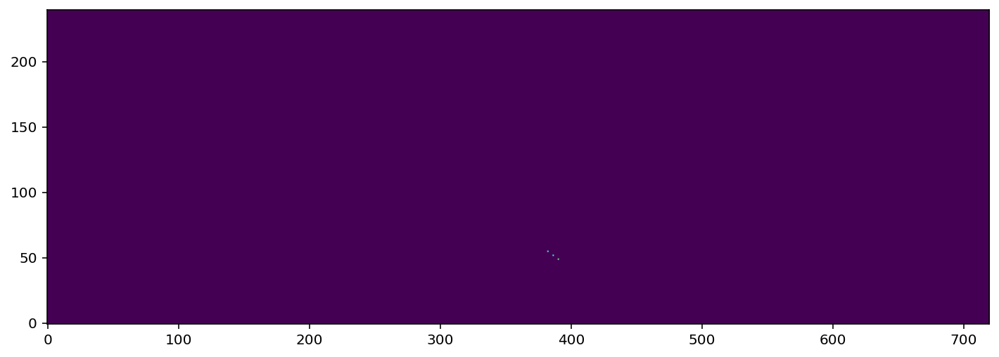

In [35]:
width, height=image.shape[0],image.shape[1]

poly_path=worm.path()

x, y = np.mgrid[:height, :width]
coors=np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) # coors.shape is (4000000,2)

mask = poly_path.contains_points(coors)
plt.imshow(mask.reshape(height, width).T)
plt.gca().invert_yaxis()

plt.show()


['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']


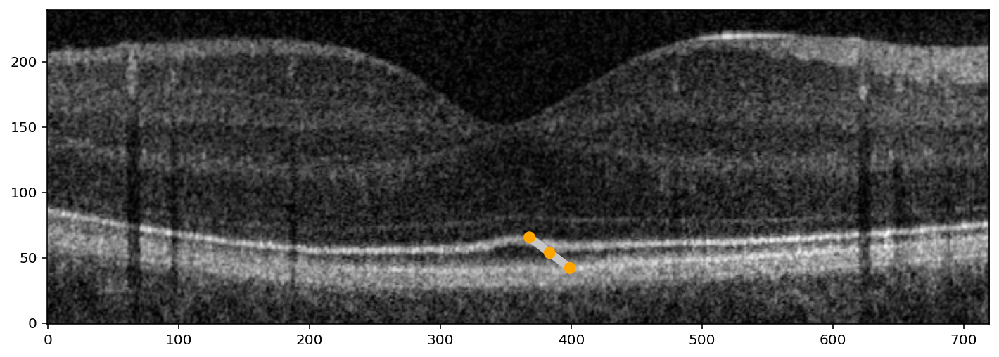

In [36]:
# draw the points
colors = list(mcolors.TABLEAU_COLORS.keys())
print(colors)
drawing = Drawing(image)
drawing.add_worms(worm)
drawing.add_dots(worm.control_points(),color='orange')

drawing.show()

# Basic Algorithm

In [37]:
class Camo_Worm_Solution:
    def __init__(self, target_image, weights, pop=40, name="unnamed_trial"):
        self.pop_size = pop # number of worms
        self.weights = weights # vector of cost weights
        self.target_image = target_image
        (self.ylim, self.xlim) = target_image.shape
        self.name = name # name of experiment to use in image names
        # create some random worms
        self.worm_pop = initialise_clew(pop, target_image.shape, (40, 30, 1))
        # Initialise a list of intermediate points for each worm
        self.all_points = []
        self.worm_widths = []
        for worm in self.worm_pop:
            self.all_points.append(list(worm.intermediate_points()))
            self.worm_widths.append(worm.width)
        # Initialise shortest distances and worm ids
        for i in range(self.pop_size):
            self.worm_pop[i].worm_id = i
            self.worm_pop[i].shortest_dist = self.calc_short_dist(i, self.worm_pop[i].intermediate_points())
        # initialise a global cost history
        self.cost_series = []
    
    # this should work for both the old worm and the new candidate worm
    def calc_short_dist(self, worm_index, worm_points):
        dist = np.inf
        for n in list(range(worm_index)) + list(range(worm_index+1, self.pop_size)): # for all OTHER worms in pop
            other_worm_width = self.worm_widths[n]
            # loop through all points in chosen worm
            for i in worm_points:
                #loop through all points in worm n
                for j in self.all_points[n]:
                    dist_temp = np.linalg.norm(i-j) - other_worm_width # calculate euclidean distance
                    if dist_temp < dist:
                        dist = dist_temp # update distance variable if this distance is shorter
        return dist
    
    # function for calculating distance cost
    def calc_dist_cost(self, worm):
        return worm.shortest_dist - worm.width
    
    ### The following function is inspired by answers given on this page:
    # https://stackoverflow.com/questions/44865023/how-can-i-create-a-circular-mask-for-a-numpy-array
    def circular_mask(self, center, radius):
        # create matrix with same shape as image and elements being the distance from the center point
        Y, X = np.ogrid[:self.ylim, :self.xlim]
        dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
        # create mask. True in pixels that are closer than the radius to the center. False everywhere else
        mask = dist_from_center <= radius
        return mask
    
    def mask_single_worm(self, worm):
        masked_image = np.zeros([self.ylim, self.xlim], dtype=bool)
        worm_points = worm.intermediate_points(max(3,int(np.ceil(worm.r/worm.width))))
        for i in range(len(worm_points)): # loop through intermediate points in worm
            mask = self.circular_mask([worm_points[i][0], worm_points[i][1]], worm.width) # make circular mask centred on point
            masked_image[mask] = True
        return masked_image
    
    def calc_colour_cost(self, worm):
        worm_mask = self.mask_single_worm(worm)
        # Now mask the original background for the selected worm
        colour_diffs = self.target_image[worm_mask] - (worm.colour * 255.0) # Find the difference between the worm and the background
        diff_mean = np.mean(colour_diffs)
        diff_std = np.std(colour_diffs)
        mean_square = (colour_diffs**2).mean()
        return mean_square , np.abs(diff_mean)*diff_std
    
    def calc_unweighted_costs(self, worm):
        worm.size = worm.approx_length() * worm.width
        worm.bend = worm.dr / worm.r
        worm.colour_cost_1 , worm.colour_cost_2 = self.calc_colour_cost(worm)
        worm.dist_cost = self.calc_dist_cost(worm)
    
    def evolve_worm(self, worm):
        midx = worm.x + rng.standard_normal()
        if midx < 0:
            midx = 0
        elif midx > self.xlim:
            midx = self.xlim
        midy = worm.y + rng.standard_normal()
        if midy < 0:
            midy = 0
        elif midy > self.ylim:
            midy = self.ylim
        r = np.abs(worm.r + rng.standard_normal())
        theta = worm.theta + rng.standard_normal()
        dr = np.abs(worm.dr + rng.standard_normal())
        dgamma = worm.dgamma + rng.standard_normal()
        colour = worm.colour + 0.05 * rng.standard_normal()
        if colour > 1:
            colour = 1
        elif colour < 0:
            colour = 0
        # setting a min width of 1 in case that fixes np.mean() error in colour cost
        width = max(worm.width + rng.standard_normal(), 1)
        return Camo_Worm(midx, midy, r, theta, dr, dgamma, width, colour)
    
    # random-walk evolution
    def evol_X_gens(self, generations, image_freq=100):
        # initialise costs for each worm
        global_cost = 0
        for worm in self.worm_pop:
            self.calc_unweighted_costs(worm)
            worm.cost = sum(np.array((worm.size, worm.bend, worm.colour_cost_1, worm.colour_cost_2, worm.dist_cost)) * self.weights)
            global_cost += worm.cost
        self.cost_series.append(global_cost)
        gen_count = 1 # start at 1 so that w
        replacement_count = 0
        drawing = Drawing(self.target_image)
        drawing.add_worms(self.worm_pop)
        drawing.show(save = self.name + '_initial.png')
        print('starting cost =', global_cost)
        while gen_count < generations:
            for worm in self.worm_pop:
                # Recalculate closest distance from other worms (other worms may have moved since last generation)
                worm.shortest_dist = self.calc_short_dist(worm.worm_id, worm.intermediate_points())
                # Recalculate cost function for worm
                worm.dist_cost = self.calc_dist_cost(worm)
                worm.cost = sum(np.array((worm.size, worm.bend, worm.colour_cost_1, worm.colour_cost_2, worm.dist_cost)) * self.weights)
                # Mutate worm through random walk
                candidate_w = self.evolve_worm(worm)
                # Find closest distance for the new worm (excluding old worm)
                candidate_w.shortest_dist = self.calc_short_dist(worm.worm_id, candidate_w.intermediate_points())
                # Sample image underneath new worm
                # Calculate cost function for mutated worm
                self.calc_unweighted_costs(candidate_w)
                candidate_w.cost = sum(np.array((candidate_w.size, candidate_w.bend, candidate_w.colour_cost_1, candidate_w.colour_cost_2, candidate_w.dist_cost)) * self.weights)
                # If new cost function lower, then replace worm with mutated version
                if candidate_w.cost < worm.cost:
                    replacement_count += 1
                    id_num = copy.deepcopy(worm.worm_id)
                    self.worm_pop[id_num] = copy.deepcopy(candidate_w)
                    self.worm_pop[id_num].worm_id = id_num
                    self.all_points[id_num] = list(candidate_w.intermediate_points())
                    self.worm_widths[id_num] = copy.deepcopy(candidate_w.width)
                # else keep old worm
            if int(gen_count % image_freq) == 0: # save an image every Y steps
                drawing = Drawing(self.target_image)
                drawing.add_worms(self.worm_pop)
                drawing.show(save = self.name + '_gen_' + str(gen_count) + '.png')
            # find new global cost
            global_cost = 0
            for worm in self.worm_pop:
                worm.shortest_dist = self.calc_short_dist(worm.worm_id, worm.intermediate_points())
                worm.dist_cost = self.calc_dist_cost(worm)
                worm.cost = sum(np.array((worm.size, worm.bend, worm.colour_cost_1, worm.colour_cost_2, worm.dist_cost)) * self.weights)
                global_cost += worm.cost
            self.cost_series.append(global_cost)
            gen_count += 1
        # save final image of results
        drawing = Drawing(self.target_image)
        drawing.add_worms(self.worm_pop)
        drawing.show(save = self.name + '_final.png')
        print('final cost = ', global_cost)
        print('completed with ', replacement_count, ' replacements')
        print('replacement rate = ', replacement_count / self.pop_size / (generations-1))
        

In [38]:
initial_weights = np.array((-1,1,10,10,-1)) # size weight, bend weight, colour 1 weight, colour 2 weight, dist weight
test_clew = Camo_Worm_Solution(image, weights=initial_weights, name='random_walk_10c10c')

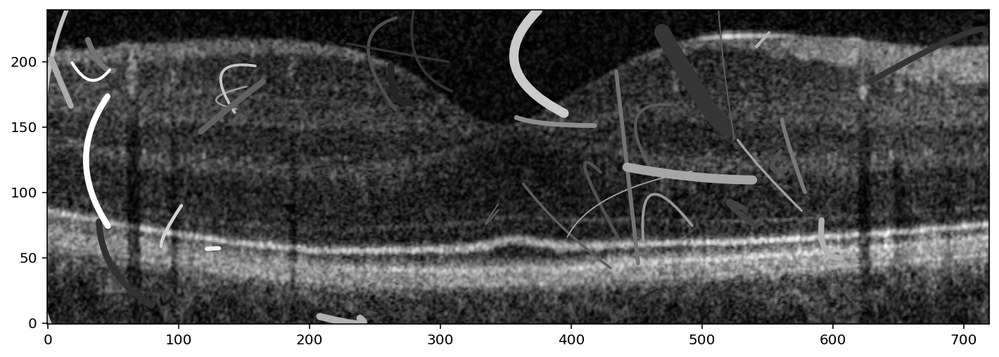

starting cost = 4829624.9798220415


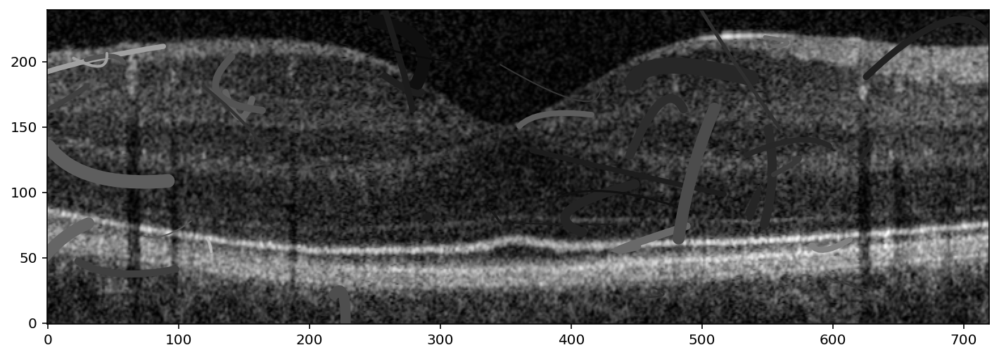

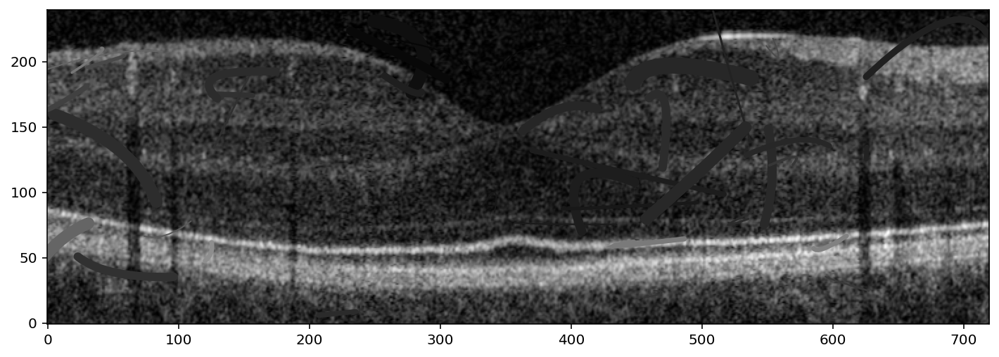

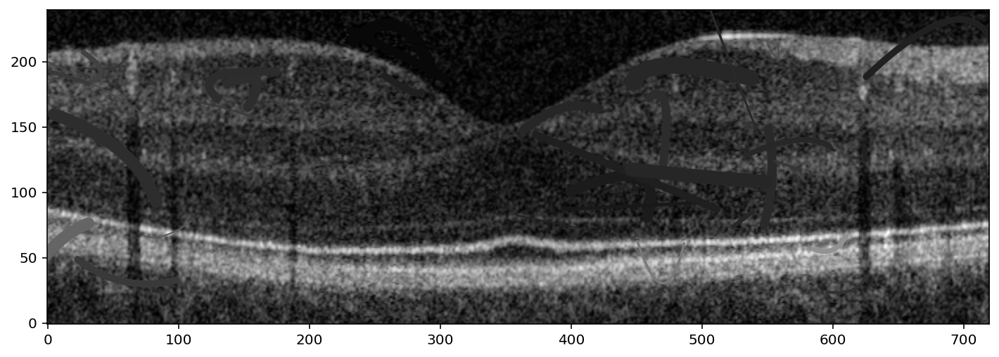

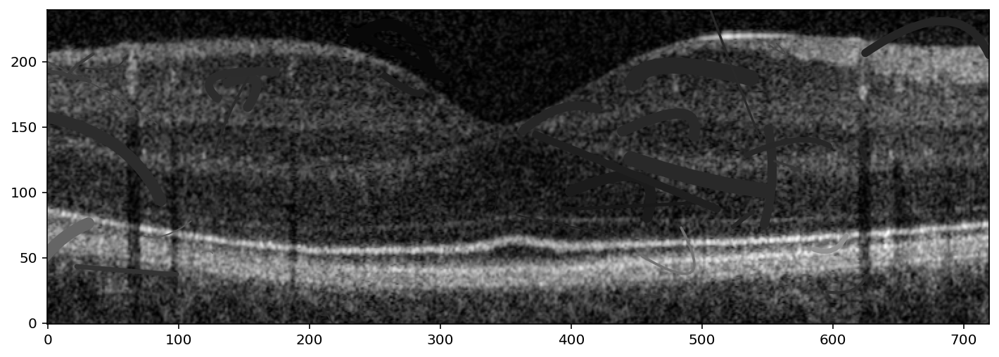

final cost =  98935.98956473634
completed with  436  replacements
replacement rate =  0.1101010101010101


In [39]:
test_clew.evol_X_gens(100, 25)

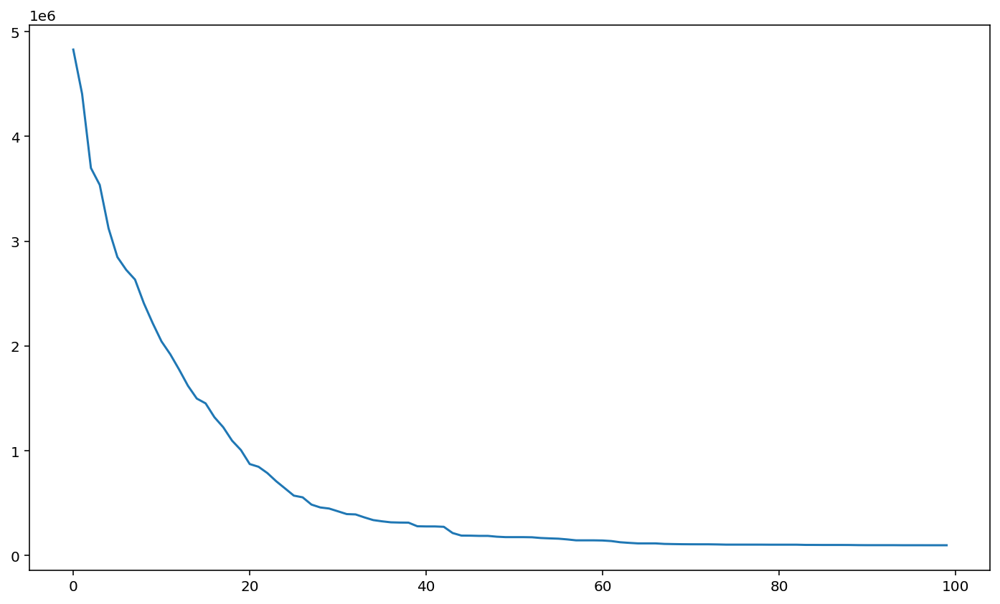

In [40]:
plt.plot(test_clew.cost_series)

# Color

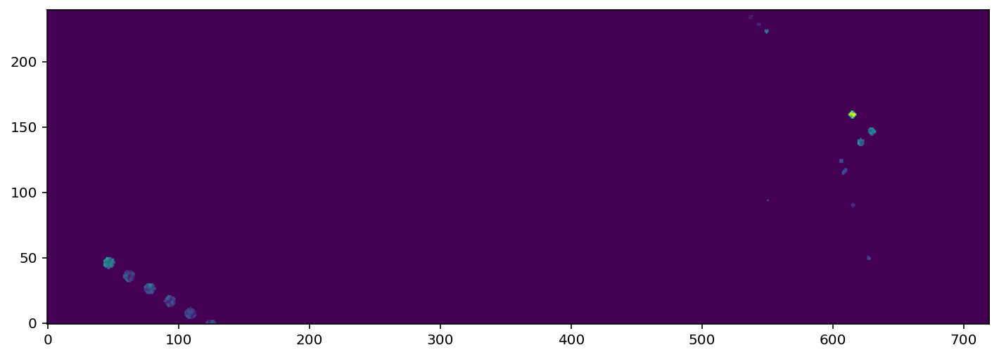

In [41]:
import numpy as np

# Apply the mask to the image
masked_image = image * masked_img[:, :]

# Display the masked image
plt.imshow(masked_image)
plt.gca().invert_yaxis()


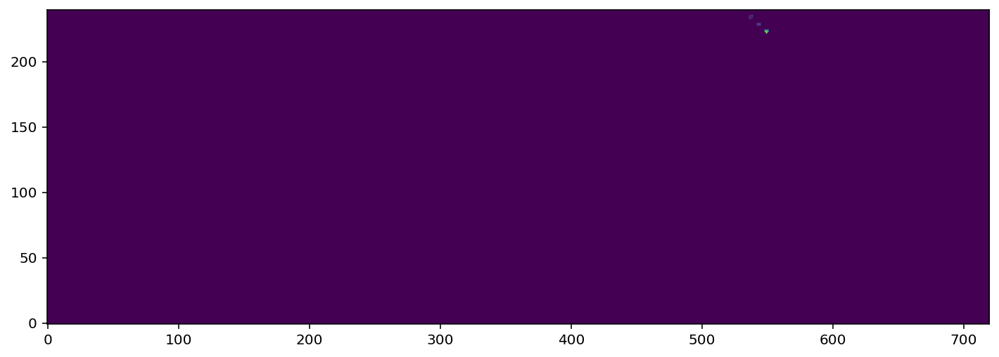

In [42]:
import numpy as np

# masked for a particular worm (example: worm 4)
worm_index = 3
binary_mask = (masked_img == worm_index).astype(np.uint8)

# Apply the binary mask to the image
masked_image = image * binary_mask[:,:]

# Display the masked image
plt.imshow(masked_image)
plt.gca().invert_yaxis()
# non_zero_mask = masked_image != 0
# print(image[non_zero_mask])

In [43]:
def color_cost(original_image,masked_image, worm_index, clew):
    # masked for a particular worm (example: worm 4)
    binary_mask = (masked_image == worm_index).astype(np.uint8)
    # The selected_masked_image separates the selected worm from other worms in the old masked_image
    selected_masked_image = masked_image * binary_mask[:, :]


    # Now mask the original background for the selected worm
    orig = original_image.copy()  # Create a copy to avoid modifying the original array
    orig = orig * selected_masked_image[:,:]
    non_zero_masked = orig != 0

    orig[non_zero_masked] -= round(clew[worm_index - 1].colour * 255)
    orig[~non_zero_masked] = 255
    magnitude = np.linalg.norm(orig[non_zero_masked]).mean()
    print(orig[non_zero_masked], magnitude)
    plt.imshow( orig, cmap='gray')  # Display the modified original image
    plt.gca().invert_yaxis()
    
    return np.log(magnitude)


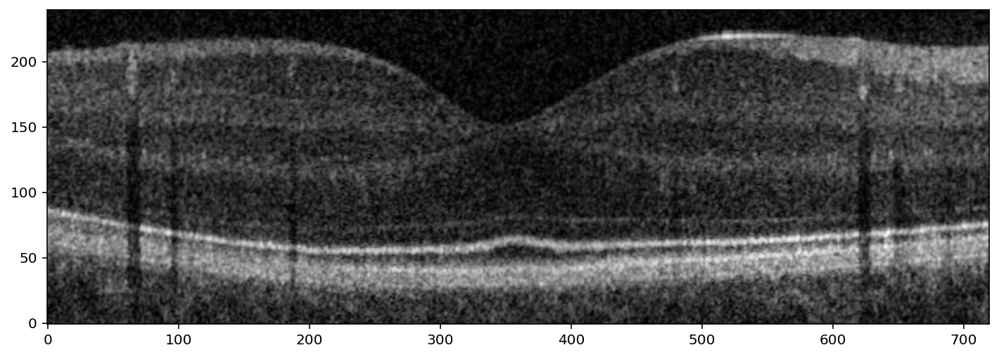

In [44]:
drawing = Drawing(original_image)
drawing.show()

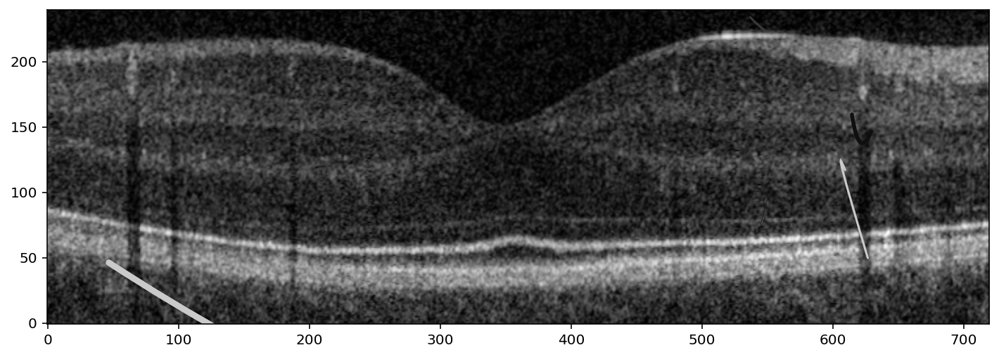

In [45]:
drawing = Drawing(image)
drawing.add_worms(clew)
drawing.show()

[-151 -128 -114 -157 -138 -119 -157 -134 -156 -158 -155 -148 -152 -162
 -164 -179 -129 -134 -122 -121 -137 -122 -122 -135 -134 -121 -129 -125
 -115 -120 -136 -128 -137 -122 -121 -124 -119 -113 -116] 847.6213777389053


6.742434047570784

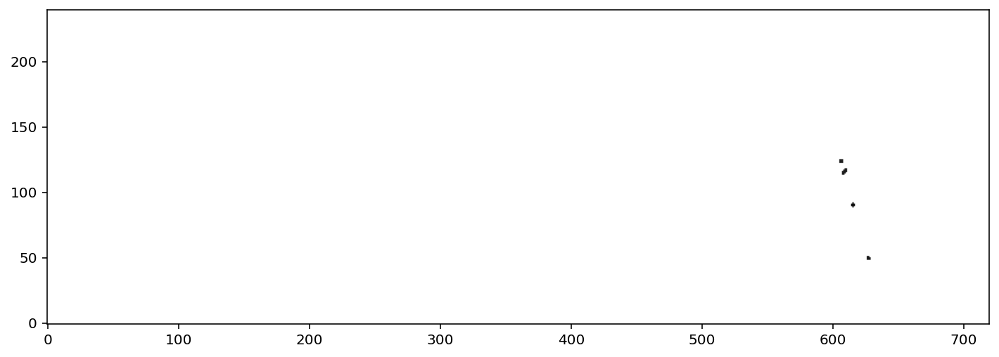

In [46]:
color_cost(original_image, masked_img, 1, clew)

## Attempting to find better way of saving image



In [74]:
class Drawing_better:
    def __init__ (self, image):
        h, w = image.shape
        self.fig, self.ax = plt.subplots(frameon=False)
        self.image = image
        #self.fig.set_size_inches(w/100,h/100)
        self.fig.tight_layout()
        self.im = self.ax.imshow(self.image, cmap='gray', origin='lower')
        self.ax.axis('off')

    def add_patches(self, patches):
        try:
            for patch in patches:
                self.ax.add_patch(patch)
        except TypeError:
            self.ax.add_patch(patches)

    def add_dots(self, points, radius=4, **kwargs):
        try:
            for point in points:
                self.ax.add_patch(mpatches.Circle((point[0],point[1]), radius, **kwargs))
        except TypeError:
            self.ax.add_patch(mpatches.Circle((points[0],points[1]), radius, **kwargs))

    def add_worms(self, worms):
        try:
            self.add_patches([w.patch() for w in worms])
        except TypeError:
            self.add_patches([worms.patch()])

    def show(self, save=None):
        if save is not None:
            plt.savefig(save, bbox_inches='tight', pad_inches=0.0)
        plt.show()

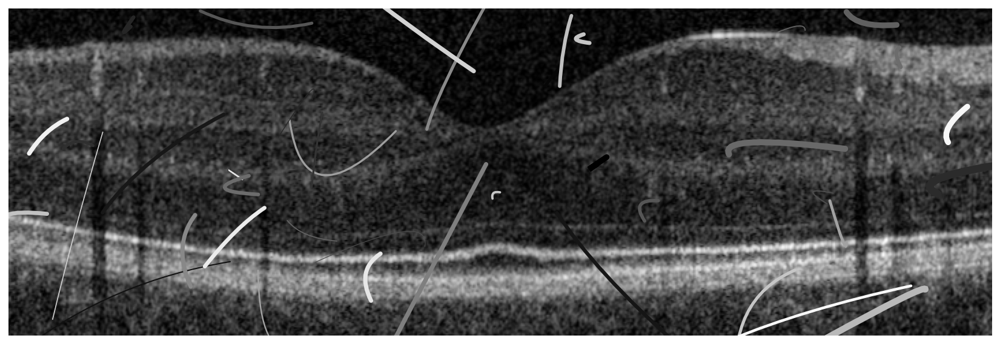

In [75]:
# Initialise clew of 40 and draw

clew = initialise_clew(40, image.shape, (40, 30, 1))
drawing = Drawing_better(image)
drawing.add_worms(clew)
drawing.show(save='test_im.png')

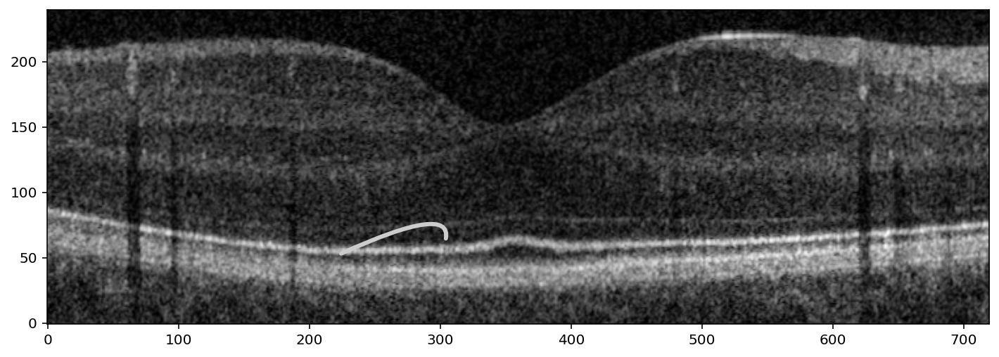

In [85]:
clew[0].colour = 0.8
clew[0].width = 3
drawing = Drawing(image)
drawing.add_worms([clew[0]])

In [86]:
worm_mask_test = test_clew.mask_single_worm(clew[0])

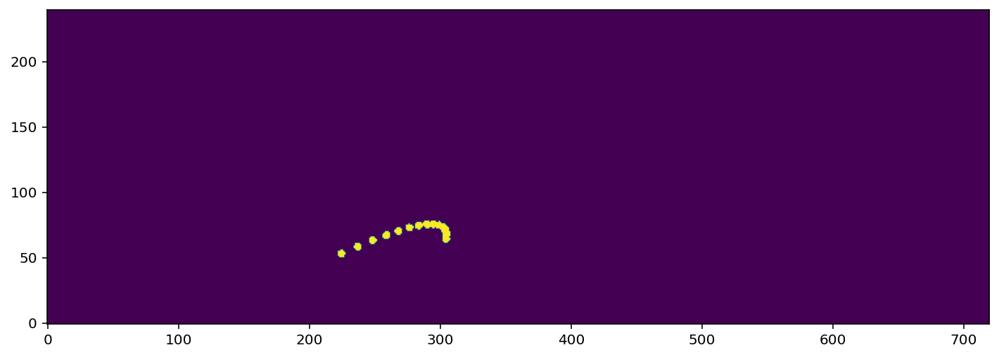

In [87]:
plt.imshow(worm_mask_test)
plt.gca().invert_yaxis()

In [88]:
worm_mask_test = test_clew.mask_single_worm(clew[0])
new_image = copy.deepcopy(image)
new_image[worm_mask_test] = int(clew[0].colour * 255.0)
iio.imwrite('test_im_full.png', np.flipud(new_image))

In [0]:
new_image[worm_mask_test] = clew[0].colour * 255.0
iio.imwrite('test_im_full.png', np.flipud(new_image))